<a href="https://colab.research.google.com/github/01-Projects-In-Python/DeepLearning-ImageClassification-TextClassification-Models/blob/main/Code-NLP-ImageClassificationCNN%2BKeras-TextClassificationGensim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Problem 1
### The relevant Dataset (CIFAR 100) have been described below.




This is a dataset of 50,000 32x32 color training images and 10,000 test images, labeled over 100 fine-grained classes that are grouped into 20 coarse-grained classes.

- Images have low resolution (32x32).

- Data Source: https://www.cs.toronto.edu/~kriz/cifar.html

Read the website thoroughly.

The dataset can be directly fetched from Keras.io Website for easy incorporation into your code.
https://keras.io/api/datasets/cifar100/


In [ ]:
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import RMSprop
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
from tensorflow import keras
from tensorflow.keras import backend as K

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar100.load_data()

In [ ]:
if K.image_data_format() == 'channels_first':
    train_images = x_train.reshape(x_train.shape[0], 3, 32, 32)
    test_images = x_test.reshape(x_test.shape[0], 3, 32, 32)
    input_shape = (3, 32, 32)
else:
    train_images = x_train.reshape(x_train.shape[0], 32, 32, 3)
    test_images = x_test.reshape(x_test.shape[0], 32, 32, 3)
    input_shape = (32, 32, 3)

In [ ]:
# Converting to Floating Point Values and Normalizing:
train_images = x_train.astype('float32')
test_images = x_test.astype('float32')
train_images /= 255
test_images /= 255

In [ ]:
# One - hot encoding:
train_labels = tensorflow.keras.utils.to_categorical(y_train, 100)
test_labels = tensorflow.keras.utils.to_categorical(y_test, 100)

In [ ]:
print(train_images.shape, train_labels.shape, test_images.shape, test_labels.shape)

(50000, 32, 32, 3) (50000, 100) (10000, 32, 32, 3) (10000, 100)


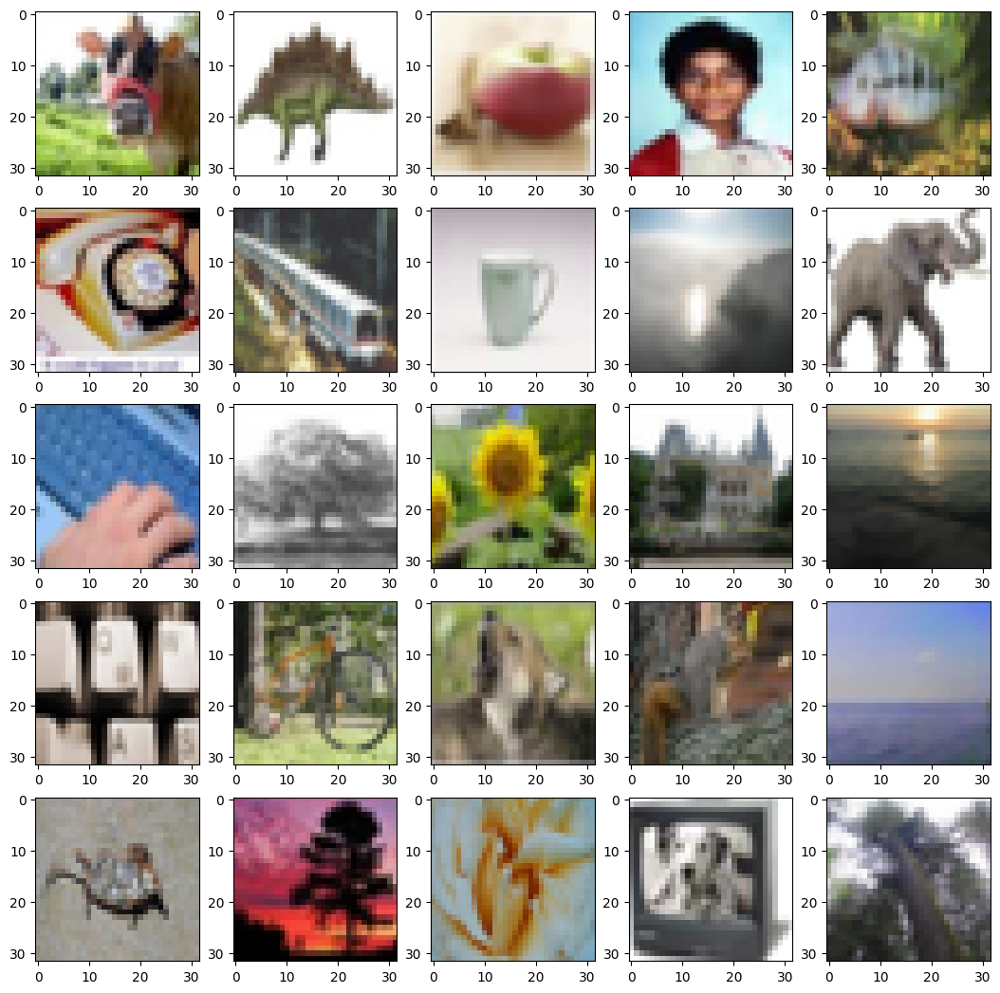

In [ ]:
# Visualizing one sample of the data
plt.figure(figsize = (13, 13))
for x in range(25):
  plt.subplot(5, 5, 1 + x)
  plt.imshow(train_images[x])

In [ ]:
# Creating the layers:
model = Sequential()
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape = input_shape))
model.add(Conv2D(128, (3, 3), activation='relu'))
# Subsampling
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
# First layer with 512 neurons
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.25))
# Final categorization 100 classes with softmax, second layer
model.add(Dense(100, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 30, 30, 64)        1792      
                                                                 
 conv2d_26 (Conv2D)          (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 14, 14, 128)      0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_18 (Dense)            (None, 512)               12845568  
                                                                 
 dropout_9 (Dropout)         (None, 512)               0         
                                                     

In [ ]:
# Compiling the layers:
model.compile(loss='categorical_crossentropy', optimizer='RMSProp', metrics=['accuracy'])

In [ ]:
history = model.fit(train_images, train_labels,
                    batch_size=32,
                    epochs=10,
                    verbose=2,
                    validation_data=(test_images, test_labels))

Epoch 1/10
1563/1563 - 14s - loss: 3.5316 - accuracy: 0.1757 - val_loss: 2.9273 - val_accuracy: 0.2868 - 14s/epoch - 9ms/step
Epoch 2/10
1563/1563 - 12s - loss: 2.6295 - accuracy: 0.3413 - val_loss: 2.5872 - val_accuracy: 0.3581 - 12s/epoch - 8ms/step
Epoch 3/10
1563/1563 - 12s - loss: 2.1346 - accuracy: 0.4491 - val_loss: 2.4319 - val_accuracy: 0.3953 - 12s/epoch - 7ms/step
Epoch 4/10
1563/1563 - 12s - loss: 1.6959 - accuracy: 0.5505 - val_loss: 2.5410 - val_accuracy: 0.3890 - 12s/epoch - 8ms/step
Epoch 5/10
1563/1563 - 12s - loss: 1.3074 - accuracy: 0.6485 - val_loss: 2.7000 - val_accuracy: 0.3973 - 12s/epoch - 8ms/step
Epoch 6/10
1563/1563 - 12s - loss: 0.9900 - accuracy: 0.7313 - val_loss: 2.9690 - val_accuracy: 0.3834 - 12s/epoch - 8ms/step
Epoch 7/10
1563/1563 - 11s - loss: 0.7741 - accuracy: 0.7852 - val_loss: 3.6287 - val_accuracy: 0.3675 - 11s/epoch - 7ms/step
Epoch 8/10
1563/1563 - 12s - loss: 0.6148 - accuracy: 0.8290 - val_loss: 3.7754 - val_accuracy: 0.3744 - 12s/epoch - 7

In [ ]:
score = model.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 4.2840776443481445
Test accuracy: 0.3783000111579895


In [ ]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


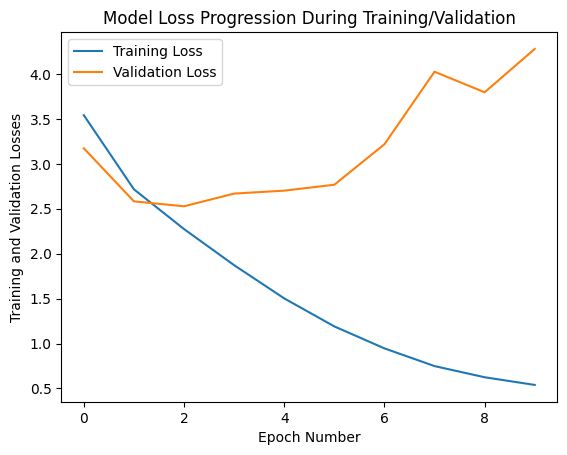

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss Progression During Training/Validation')
plt.ylabel('Training and Validation Losses')
plt.xlabel('Epoch Number')
plt.legend(['Training Loss', 'Validation Loss'])

In [ ]:
predictions = model.predict(test_images)

313/313 [==============================] - 1s 3ms/step


In [ ]:
predicted_classes = predictions.argmax(axis=1)

In [ ]:
# CAMEL VALIDATION
camel_img = tensorflow.keras.utils.load_img("camel.jpg", target_size=(32, 32))
tv_img = tensorflow.keras.utils.load_img("television.jpg", target_size=(32, 32))
w_img = tensorflow.keras.utils.load_img("wardrobe.jpg", target_size=(32, 32))
truck_img = tensorflow.keras.utils.load_img("c.jpg", target_size=(32, 32))

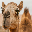

In [ ]:
camel_img

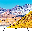

In [ ]:
tv_img

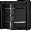

In [ ]:
w_img

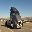

In [ ]:
truck_img

In [ ]:
camel_array = tensorflow.keras.preprocessing.image.img_to_array(camel_img)
camel_array = camel_array.astype('float32') / 255.0
camel_array = np.expand_dims(camel_array, axis=0)
camel_predictions = model.predict(camel_array)
predicted_class_camel = np.argmax(camel_predictions[0])

1/1 [==============================] - 0s 20ms/step


In [ ]:
tv_array = tensorflow.keras.preprocessing.image.img_to_array(tv_img)
tv_array = tv_array.astype('float32') / 255.0
tv_array = np.expand_dims(tv_array, axis=0)
tv_predictions = model.predict(tv_array)
predicted_class_tv = np.argmax(tv_predictions[0])

1/1 [==============================] - 0s 42ms/step


In [ ]:
w_array = tensorflow.keras.preprocessing.image.img_to_array(w_img)
w_array = w_array.astype('float32') / 255.0
w_array = np.expand_dims(w_array, axis=0)
w_predictions = model.predict(w_array)
predicted_class_w = np.argmax(w_predictions[0])

1/1 [==============================] - 0s 24ms/step


In [ ]:
truck_array = tensorflow.keras.preprocessing.image.img_to_array(truck_img)
truck_array = truck_array.astype('float32') / 255.0
truck_array = np.expand_dims(truck_array, axis=0)
truck_predictions = model.predict(truck_array)
predicted_class_truck = np.argmax(truck_predictions[0])

1/1 [==============================] - 0s 19ms/step


In [ ]:
class_names = ["apple",	    "aquarium_fish",	    "baby",	    "bear",	    "beaver",	    "bed",	    "bee",	    "beetle",	    "bicycle",	    "bottle",	    "bowl",	    "boy",	    "bridge",	    "bus",	    "butterfly",	    "camel",	    "can",	    "castle",	    "caterpillar",	    "cattle",	    "chair",	    "chimpanzee",	    "clock",	    "cloud",	    "cockroach",	    "couch",	    "crab",	    "crocodile",	    "cup",	    "dinosaur",	    "dolphin",	    "elephant",	    "flatfish",	    "forest",	    "fox",	    "girl",	    "hamster",	    "house",	    "kangaroo",	    "keyboard",	    "lamp",	    "lawn_mower",	    "leopard",	    "lion",	    "lizard",	    "lobster",	    "man",	    "maple_tree",	    "motorcycle",	    "mountain",	    "mouse",	    "mushroom",	    "oak_tree",	    "orange",	    "orchid",	    "otter",	    "palm_tree",	    "pear",	    "pickup_truck",	    "pine_tree",	    "plain",	    "plate",	    "poppy",	    "porcupine",	    "possum",	    "rabbit",	    "raccoon",	    "ray",	    "road",	    "rocket",	    "rose",	    "sea",	    "seal",	    "shark",	    "shrew",	    "skunk",	    "skyscraper",	    "snail",	    "snake",	    "spider",	    "squirrel",	    "streetcar",	    "sunflower",	    "sweet_pepper",	    "table",	    "tank",	    "telephone",	    "television",	    "tiger",	    "tractor",	    "train",	    "trout",	    "tulip",	    "turtle",	    "wardrobe",	    "whale",	    "willow_tree",	    "wolf",	    "woman",	    "worm"]

In [ ]:
print("Predicted class camel:", class_names[predicted_class_camel])
print("Predicted class tv:", class_names[predicted_class_tv])
print("Predicted class wardrobe:", class_names[predicted_class_w])
print("Predicted class truck:", class_names[predicted_class_truck])

Predicted class camel: forest
Predicted class tv: tractor
Predicted class wardrobe: television
Predicted class truck: bicycle


## Text Classification on the tweet data about COVID19.

In [ ]:
# !pip install pyLDAvis

In [ ]:
import nltk
nltk.download('stopwords')

import gensim
from gensim import corpora, models

from pprint import pprint



import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import matplotlib.pyplot as plt
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
import pandas as pd
import string
stopwords = nltk.corpus.stopwords.words('english')
string.punctuation
from wordcloud import WordCloud

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df = pd.read_csv('Tweets_Corona_NLP.csv', encoding='latin-1')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


2. Properly remove punctuations, stopwords and any words of length 1 or 2.

In [ ]:
# Function to remove the punctuation signs,  the stopwords and words with lengh 1 or 2:
def message_cleaning(message):
    Test_punc_removed = [w for w in message if w not in string.punctuation]
    Test_punc_removed_join = ''.join(Test_punc_removed)
    Test_punc_removed_join_clean = [word for word in Test_punc_removed_join.split()
                                    if word.lower() not in stopwords and len(word) > 2]
    return Test_punc_removed_join_clean

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df['OriginalTweet'] = df['OriginalTweet'].apply(message_cleaning)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,"[MeNyrbie, PhilGahan, Chrisitv, httpstcoiFz9FA...",Neutral
1,3800,48752,UK,16-03-2020,"[advice, Talk, neighbours, family, exchange, p...",Positive
2,3801,48753,Vagabonds,16-03-2020,"[Coronavirus, Australia, Woolworths, give, eld...",Positive
3,3802,48754,NaN,16-03-2020,"[food, stock, one, empty, PLEASE, dont, panic,...",Positive
4,3803,48755,NaN,16-03-2020,"[ready, supermarket, COVID19, outbreak, parano...",Extremely Negative


3. Get the wordcloud after applying step 1 and step 2.

In [ ]:
# Converting the list of list of the OriginalTweet column to an string
cleaned_tweets = df['OriginalTweet'].apply(lambda x: ' '.join(x))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


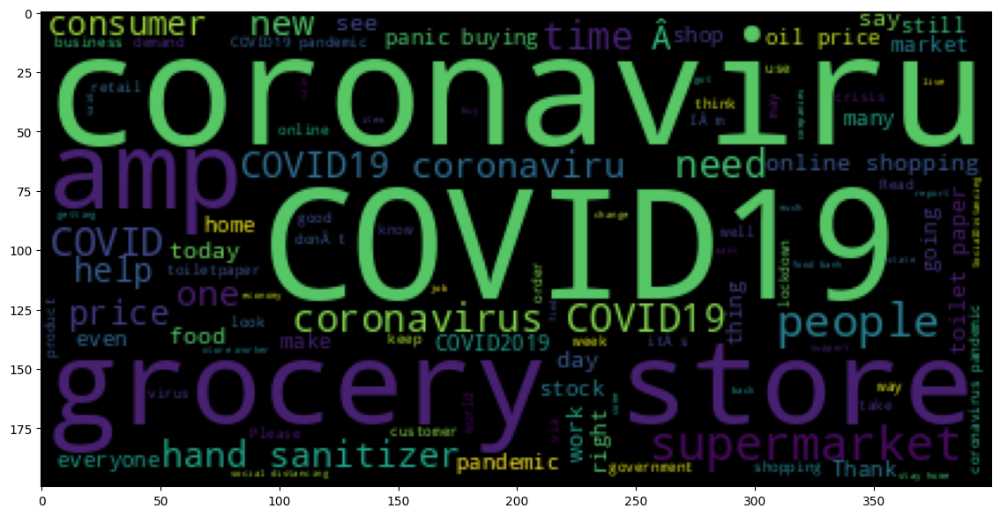

In [ ]:
wc = WordCloud(
    background_color='black',
    max_words = 100,
    random_state = 42,
    max_font_size=110
    )

wc.generate(' '.join(cleaned_tweets))
plt.figure(figsize=(30,7))
plt.imshow(wc)
plt.show()

4. Change number of Topics to 20 in the Gensim LDAMulticore and draw the visualisation as shown in samplecode. Also figure out, about how many topic clusters could be ideal for such application.

In [ ]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,"[MeNyrbie, PhilGahan, Chrisitv, httpstcoiFz9FA...",Neutral
1,3800,48752,UK,16-03-2020,"[advice, Talk, neighbours, family, exchange, p...",Positive
2,3801,48753,Vagabonds,16-03-2020,"[Coronavirus, Australia, Woolworths, give, eld...",Positive
3,3802,48754,NaN,16-03-2020,"[food, stock, one, empty, PLEASE, dont, panic,...",Positive
4,3803,48755,NaN,16-03-2020,"[ready, supermarket, COVID19, outbreak, parano...",Extremely Negative


In [ ]:
df['OriginalTweet'] = df['OriginalTweet'].apply(lambda x: ' '.join(x))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,MeNyrbie PhilGahan Chrisitv httpstcoiFz9FAn2Pa...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk neighbours family exchange phone n...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia Woolworths give elderly ...,Positive
3,3802,48754,NaN,16-03-2020,food stock one empty PLEASE dont panic ENOUGH ...,Positive
4,3803,48755,NaN,16-03-2020,ready supermarket COVID19 outbreak paranoid fo...,Extremely Negative


In [ ]:
documents = df['OriginalTweet'].tolist()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
texts = [
    [word for word in document.lower().split() if word not in stopwords]
    for document in documents
]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
tfidf = models.TfidfModel(corpus)

corpus_tfidf = tfidf[corpus]
for doc in corpus_tfidf:
    print(doc)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Streaming output truncated to the last 5000 lines.
[(52, 0.12789490189076128), (86, 0.19657247953157625), (107, 0.08509350899061162), (130, 0.1555898956612658), (201, 0.2223261795081894), (360, 0.16072838459814173), (603, 0.199229622831817), (642, 0.20601333399577298), (658, 0.18843142432902127), (666, 0.168504303670875), (701, 0.21154290668780934), (747, 0.19339865568318348), (1096, 0.1680649912641298), (1109, 0.18610389315816567), (1214, 0.16002611484770493), (1399, 0.2939028343230188), (3464, 0.30211234493199063), (4935, 0.36896372424756313), (4936, 0.32108346615598793), (4937, 0.32362723174264846)]
[(32, 0.041945145215281775), (50, 0.164911552197128), (53, 0.1349834876783374), (54, 0.1233491102386429), (55, 0.1413668345116262), (86, 0.09216231837284324), (153, 0.1645668890666244), (866, 0.19659734851749747), (1036, 0.21673104030298646), (1103, 0.21359652139704388), (1348, 0.22378355750095585), (1376, 0.20487318572052166), (2899, 0.3617588571220032), (3182, 0.2531545455572639), (322

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
[(31, 0.07224128386693289), (70, 0.14717475791940543), (1272, 0.46483531159264474), (27669, 0.870085582361408)]
[(26, 0.07404207016960984), (31, 0.026126300933346475), (138, 0.12048693155070397), (139, 0.07564524750713404), (323, 0.0507936875891048), (905, 0.16549736546721386), (1121, 0.15387644093234468), (1636, 0.13914033745281093), (3935, 0.19653350188839608), (5976, 0.410842512440529), (10321, 0.24365442738294757), (10830, 0.21934065931141822), (13410, 0.21598437107358007), (13535, 0.23446902710274709), (16029, 0.23446902710274709), (27028, 0.2464770881643457), (27670, 0.31466934896135434), (27671, 0.31466934896135434), (27672, 0.2670050041363863), (27673, 0.31466934896135434)]
[(31, 0.034180383565409894), (50, 0.14885758252966144), (53, 0.12184298425134574), (55, 0.12760491884835873), (57, 0.1352309174562048), (94, 0.13052699724827604), (153, 0.14854647199974208), (193, 0.1956324968676333), (200, 0.16480434920251386), (406, 0.0936

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
[(31, 0.05375767283053312), (69, 0.2829758491719598), (265, 0.4032706644182216), (338, 0.2926263584648733), (1480, 0.19694184228033704), (37952, 0.4591067840352462), (41111, 0.6474660134405263)]
[(32, 0.03404586239571256), (70, 0.06261632305113887), (149, 0.13219346131980658), (154, 0.18593826953254053), (169, 0.17054470954363898), (171, 0.14174302804263098), (471, 0.15811806820087257), (478, 0.1810230570358163), (519, 0.2028030852706625), (658, 0.14341568085470413), (666, 0.12824909392877953), (1329, 0.20141012223291893), (1461, 0.20673507708704913), (2223, 0.20196315355801137), (2837, 0.27823737648283003), (4734, 0.33190685441336154), (7722, 0.4494922197942103), (8746, 0.2594586079894599), (10522, 0.2580363598236714), (41112, 0.33190685441336154)]
[(31, 0.04695484432781568), (534, 0.22054478254110585), (866, 0.2437816496851037), (950, 0.2900271493004177), (1107, 0.2365955683759484), (1749, 0.3098339819404489), (15441, 0.3562572465785

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
[(32, 0.02772611949404763), (125, 0.1193130250593726), (146, 0.1731709151284802), (165, 0.14608388119288945), (194, 0.08627914561673636), (356, 0.13745053275088912), (840, 0.1882882008833038), (844, 0.1719633693664375), (945, 0.31083546969125164), (1409, 0.16969231419468483), (1951, 0.17379452358981223), (4101, 0.2194591743854359), (4927, 0.19901508748746008), (5086, 0.16810088535599235), (5095, 0.18577567154922875), (5847, 0.2210809325084849), (5852, 0.21250430438904547), (9126, 0.1817475432479196), (13239, 0.21792512280151194), (17662, 0.20795489551358645), (17976, 0.213765536151616), (58442, 0.3014678160199827), (58443, 0.3014678160199827), (58444, 0.3014678160199827)]
[(101, 0.0639832441479199), (107, 0.06156308923441514), (139, 0.08459098337900375), (162, 0.12010642276677025), (169, 0.16211340033692143), (295, 0.10736074560403931), (408, 0.1480463283142535), (420, 0.11480742630615516), (502, 0.20759712365688457), (828, 0.240364331

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
[(31, 0.030236589022423287), (90, 0.1002486375846168), (699, 0.2238416876712156), (884, 0.17520293465576037), (1336, 0.1904389014482046), (1746, 0.2003710622730968), (10884, 0.5639741196480509), (70354, 0.3641743164013716), (70355, 0.3641743164013716), (70356, 0.34041687135329735), (70357, 0.3641743164013716)]
[(31, 0.0325863397714401), (32, 0.03609609609021469), (37, 0.1613982374017639), (70, 0.06638706305628682), (121, 0.1158494960203362), (386, 0.2195250616983197), (1095, 0.14496138744640982), (1167, 0.2123935258143067), (1214, 0.1291308661729314), (1245, 0.21073929508379885), (1258, 0.28782096914982125), (2015, 0.2195250616983197), (2102, 0.1592632766206588), (4138, 0.21884727547115723), (5300, 0.2254478486919161), (7183, 0.24724008457994665), (70358, 0.3924750904107088), (70359, 0.3924750904107088), (70360, 0.3924750904107088)]
[(31, 0.04651314149577715), (214, 0.11957466212110675), (255, 0.20500467822140286), (70361, 0.5602117188

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[(31, 0.058448438243102266), (883, 0.34631059078038634), (1480, 0.21412651441018324), (3882, 0.4764457583053699), (7521, 0.3289970366632573), (85375, 0.7039623426479886)]
[(31, 0.03122306089217795), (178, 0.1389403577945432), (214, 0.08026735749310497), (295, 0.1147362481777028), (305, 0.09191624752047052), (487, 0.2397874006435718), (623, 0.1828246203153303), (983, 0.1964300902694451), (1450, 0.2666543828847199), (2236, 0.19991417635927555), (3173, 0.2011561622267604), (3228, 0.236896572918958), (3564, 0.27184311457249216), (12118, 0.2757797196261601), (33468, 0.31909276111973417), (34212, 0.31263986057071574), (49994, 0.3515230072779178), (85376, 0.3760555414479756)]
[(31, 0.0259440400515997), (81, 0.0901556864692558), (90, 0.08601680125641227), (136, 0.10897373839541431), (189, 0.13293879167569092), (194, 0.08942912961056823), (298, 0.2054966880185834), (368, 0.16340316967931903), (710, 0.10964983530628405), (832, 0.20255334155528787), (904, 0.11523258933195782), (1905, 0.186296389

In [ ]:
lda_model = gensim.models.LdaMulticore(corpus_tfidf,
                                       num_topics=20,
                                       id2word = dictionary,
                                       passes = 16,
                                       workers=8)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
top_topics = lda_model.top_topics(corpus_tfidf)
num_topics = 80
# Average topic coherence is the sum of topic coherences of all topics, divided by the number of topics.
avg_topic_coherence = sum([t[1] for t in top_topics]) / num_topics
print('Average topic coherence: %.4f.' % avg_topic_coherence)

from pprint import pprint
pprint(top_topics)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Average topic coherence: -3.2337.
[([(0.0054988256, 'store'),
   (0.0052786297, 'grocery'),
   (0.0051332447, 'covid19'),
   (0.0048938147, 'workers'),
   (0.004820552, 'amp'),
   (0.0046947743, 'food'),
   (0.0045721573, 'coronavirus'),
   (0.0043651005, 'people'),
   (0.0042010616, 'supermarket'),
   (0.0039820033, 'prices'),
   (0.0037189263, 'covid'),
   (0.0035534631, 'online'),
   (0.003267778, 'pandemic'),
   (0.0032385627, 'sanitizer'),
   (0.003218524, 'shopping'),
   (0.00305587, 'help'),
   (0.0029950296, 'consumer'),
   (0.0028238082, 'hand'),
   (0.0028214273, 'need'),
   (0.002750901, 'get')],
  -2.8018478568823806),
 ([(0.006752439, 'supermarket'),
   (0.0052740877, 'coronavirus'),
   (0.0048883883, 'grocery'),
   (0.004887899, 'store'),
   (0.0047605196, 'covid19'),
   (0.0047564623, 'people'),
   (0.0042167455, 'shopping'),
   (0.003951887, 'get'),
   (0.0036666973, 'toilet'),
   (0.0036402396, 'food'),
   (0.0034637637, 'paper'),
   (0.0032857703, 'going'),
   (0.0030

In [ ]:
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus_tfidf, dictionary)
vis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
15    -0.369795 -0.012231       1        1  33.967523
14    -0.251483 -0.108011       2        1  14.971401
12    -0.180478  0.121072       3        1   8.173753
9     -0.139766  0.092478       4        1   5.918178
0     -0.058944  0.000456       5        1   3.905335
3     -0.018992 -0.022969       6        1   2.951836
2     -0.004075 -0.068844       7        1   2.806124
19     0.030931  0.030672       8        1   2.637943
11     0.019396 -0.042276       9        1   2.586910
1      0.038383 -0.013141      10        1   2.435969
4      0.069349 -0.013136      11        1   2.286469
16     0.066709 -0.014498      12        1   2.211121
8      0.073041  0.018974      13        1   2.189966
18     0.091076  0.002661      14        1   2.019563
10     0.100212  0.005952      15        1   1.983509
7      0.102885  0.004615      16        1   1.835503
17     0.108106  0.000549      17        1   1.819707
5      0.103208  0.007811      18        1   1.796744
13     0.109223  0.003573      19        1   1.783453
6      0.111014  0.006295      20        1   1.718992, topic_info=             Term        Freq       Total Category  logprob  loglift
214      consumer  370.000000  370.000000  Default  30.0000  30.0000
323        prices  428.000000  428.000000  Default  29.0000  29.0000
1805          oil  187.000000  187.000000  Default  28.0000  28.0000
1361        scams   62.000000   62.000000  Default  27.0000  27.0000
174        demand  234.000000  234.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
9389          fox    2.794462    6.506403  Topic20  -6.8583   3.2183
1904    announces    3.441192   10.140969  Topic20  -6.6501   2.9827
12180       japan    2.604574   14.597539  Topic20  -6.9286   2.3398
1780   washington    2.379823   10.007769  Topic20  -7.0189   2.6271
16282      comics    1.776537    3.890410  Topic20  -7.3112   3.2796

[1189 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
2042      10  0.884541     10000
233       11  0.888651       101
12855      8  0.800488       130
14739      3  0.978550      2008
1048       1  0.373040      2020
...      ...       ...       ...
10860     10  0.775028       yoy
1679       1  0.943471    yâall
14222     13  0.913454  zimbabwe
2285       4  0.184516      âwe
2285       6  0.738063      âwe

[2589 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[16, 15, 13, 10, 1, 4, 3, 20, 12, 2, 5, 17, 9, 19, 11, 8, 18, 6, 14, 7])

5. Write a complete code using TF-IDF along with Random Forest Classifier to build a Tweet Sentiment classification Model.Use your own discretion to determine the relevant hyperparameters and model parameters. Make sure to provide justification while dropping a column. Remember this is a multiclass classification problem. Give the relevant precision and recall for the model.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import seaborn as sns

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: xlabel='count', ylabel='Sentiment'>

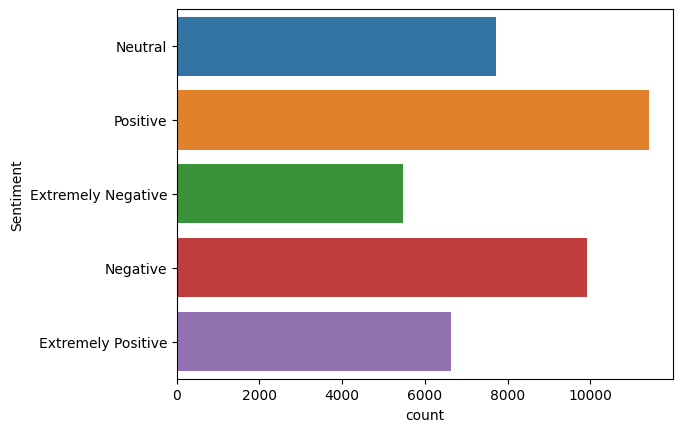

In [ ]:
sns.countplot(y = 'Sentiment', data=df)

Here, we will aply the TfidfVectorizer() technique in order to convert the OriginalTweet variable into a numerical representation of a text corpus that captures the importance of individual words or terms within each document relative to the entire corpus. Additionally, I will use just the OriginalTweet column, at the end, this is the one that will define the Sentiment category column.

In [ ]:
tfidf_vect = TfidfVectorizer()
X_tfidf = tfidf_vect.fit_transform(df['OriginalTweet'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(tfidf_vect.get_feature_names_out())

['000' '0000009375' '000042' ... 'ã¼berweist' 'ã¼cretsiz' 'ã¼retime']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(X_tfidf.toarray())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
X_tfidf.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(41157, 85101)

In [ ]:
mapping = {'Extremely Negative': 1, 'Extremely Positive': 2, 'Negative': 3, 'Neutral': 4, 'Positive': 5}

# Apply the mapping to y2_nearmiss column
df['Sentiment2'] = df['Sentiment'].map(mapping)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Due to the data in imbalanced, we will undersample it in order to build the model:
X4 = X_tfidf
y4 = df['Sentiment2'].values

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
from imblearn.under_sampling import NearMiss
nearmiss = NearMiss(version=2)
from collections import Counter

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
X2_nearmiss, y2_nearmiss= nearmiss.fit_resample(X4, y4)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Check the number of records after over sampling
print(sorted(Counter(y2_nearmiss).items()))

[(1, 5481), (2, 5481), (3, 5481), (4, 5481), (5, 5481)]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
X5_train, X5_test, y5_train, y5_test = train_test_split(X2_nearmiss, y2_nearmiss, test_size=0.2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df_rf = RandomForestClassifier(n_estimators=100) # the most used parameters are estimators and criterion
df_rf.fit(X5_train, y5_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


RandomForestClassifier()

In [ ]:
y_pred = df_rf.predict(X5_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Evaluationg the model performance using classification report (precision, recall, f1-score)
print(classification_report(y5_test,y_pred))

              precision    recall  f1-score   support

           1       0.62      0.68      0.65      1084
           2       0.59      0.72      0.65      1078
           3       0.53      0.29      0.38      1172
           4       0.49      0.86      0.62      1032
           5       0.51      0.25      0.33      1115

    accuracy                           0.55      5481
   macro avg       0.55      0.56      0.53      5481
weighted avg       0.55      0.55      0.52      5481



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
accuracy_rf = df_rf.score(X5_test, y5_test)
print('Model accuracy {0}'.format(accuracy_rf))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Model accuracy 0.5508118956394819
